# System 2: Road Extraction with Gen.jl + Adaptive Computation

This notebook runs the complete probabilistic inference pipeline for rural road extraction.

## Pipeline Overview:
1. **Load SAM-Road outputs** (probability masks from System 1)
2. **Generate diverse hypotheses** (random perturbations)
3. **MCMC refinement** (Gen.jl probabilistic inference)
4. **🆕 ADAPTIVE COMPUTATION** (Δ-based resource allocation)
5. **Visualization** (create GIF and final overlay)

---

## 1. Install & Load Dependencies

Run this cell first to install all required packages.

In [1]:
# Install packages (only need to run once)
using Pkg
Pkg.activate(".")

ENV["JULIA_PYTHONCALL_EXE"] = expanduser("~/.conda/envs/roadtracer/bin/python")

# Optional: tell it not to manage its own conda
ENV["JULIA_CONDAPKG_BACKEND"] = "Null"

packages = [
    "Gen",
    "Images",
    "FileIO",
    "ImageDraw",
    "ColorTypes",
    "StaticArrays",
    "StatsBase",
    "Statistics",
    "LinearAlgebra",
    "Random",
    "Printf",
    "ImageFiltering",
    "PythonCall",
    "ImageMorphology",
    "DataStructures",
    "Plots"
]

println("Installing packages...")
for pkg in packages
    Pkg.add(pkg)
    println("✓ $pkg installed")
end

println("\n✓ All packages installed!")

  Activating project at `~/Algorithms-of-the-Mind/FinalProject/FinalProject2/sam_road/system2`


Installing packages...


   Resolving package versions...
  No Changes to `~/Algorithms-of-the-Mind/FinalProject/FinalProject2/sam_road/system2/Project.toml`
  No Changes to `~/Algorithms-of-the-Mind/FinalProject/FinalProject2/sam_road/system2/Manifest.toml`


✓ Gen installed


   Resolving package versions...
  No Changes to `~/Algorithms-of-the-Mind/FinalProject/FinalProject2/sam_road/system2/Project.toml`
  No Changes to `~/Algorithms-of-the-Mind/FinalProject/FinalProject2/sam_road/system2/Manifest.toml`


✓ Images installed


   Resolving package versions...
  No Changes to `~/Algorithms-of-the-Mind/FinalProject/FinalProject2/sam_road/system2/Project.toml`
  No Changes to `~/Algorithms-of-the-Mind/FinalProject/FinalProject2/sam_road/system2/Manifest.toml`


✓ FileIO installed


   Resolving package versions...
  No Changes to `~/Algorithms-of-the-Mind/FinalProject/FinalProject2/sam_road/system2/Project.toml`
  No Changes to `~/Algorithms-of-the-Mind/FinalProject/FinalProject2/sam_road/system2/Manifest.toml`


✓ ImageDraw installed


   Resolving package versions...
  No Changes to `~/Algorithms-of-the-Mind/FinalProject/FinalProject2/sam_road/system2/Project.toml`
  No Changes to `~/Algorithms-of-the-Mind/FinalProject/FinalProject2/sam_road/system2/Manifest.toml`


✓ ColorTypes installed


   Resolving package versions...
  No Changes to `~/Algorithms-of-the-Mind/FinalProject/FinalProject2/sam_road/system2/Project.toml`
  No Changes to `~/Algorithms-of-the-Mind/FinalProject/FinalProject2/sam_road/system2/Manifest.toml`


✓ StaticArrays installed


   Resolving package versions...
  No Changes to `~/Algorithms-of-the-Mind/FinalProject/FinalProject2/sam_road/system2/Project.toml`
  No Changes to `~/Algorithms-of-the-Mind/FinalProject/FinalProject2/sam_road/system2/Manifest.toml`


✓ StatsBase installed


   Resolving package versions...
  No Changes to `~/Algorithms-of-the-Mind/FinalProject/FinalProject2/sam_road/system2/Project.toml`
  No Changes to `~/Algorithms-of-the-Mind/FinalProject/FinalProject2/sam_road/system2/Manifest.toml`


✓ Statistics installed


   Resolving package versions...
  No Changes to `~/Algorithms-of-the-Mind/FinalProject/FinalProject2/sam_road/system2/Project.toml`
  No Changes to `~/Algorithms-of-the-Mind/FinalProject/FinalProject2/sam_road/system2/Manifest.toml`


✓ LinearAlgebra installed


   Resolving package versions...
  No Changes to `~/Algorithms-of-the-Mind/FinalProject/FinalProject2/sam_road/system2/Project.toml`
  No Changes to `~/Algorithms-of-the-Mind/FinalProject/FinalProject2/sam_road/system2/Manifest.toml`


✓ Random installed


   Resolving package versions...
  No Changes to `~/Algorithms-of-the-Mind/FinalProject/FinalProject2/sam_road/system2/Project.toml`
  No Changes to `~/Algorithms-of-the-Mind/FinalProject/FinalProject2/sam_road/system2/Manifest.toml`


✓ Printf installed


   Resolving package versions...
  No Changes to `~/Algorithms-of-the-Mind/FinalProject/FinalProject2/sam_road/system2/Project.toml`
  No Changes to `~/Algorithms-of-the-Mind/FinalProject/FinalProject2/sam_road/system2/Manifest.toml`


✓ ImageFiltering installed


   Resolving package versions...
  No Changes to `~/Algorithms-of-the-Mind/FinalProject/FinalProject2/sam_road/system2/Project.toml`
  No Changes to `~/Algorithms-of-the-Mind/FinalProject/FinalProject2/sam_road/system2/Manifest.toml`


✓ PythonCall installed


   Resolving package versions...
  No Changes to `~/Algorithms-of-the-Mind/FinalProject/FinalProject2/sam_road/system2/Project.toml`
  No Changes to `~/Algorithms-of-the-Mind/FinalProject/FinalProject2/sam_road/system2/Manifest.toml`


✓ ImageMorphology installed


   Resolving package versions...
  No Changes to `~/Algorithms-of-the-Mind/FinalProject/FinalProject2/sam_road/system2/Project.toml`
  No Changes to `~/Algorithms-of-the-Mind/FinalProject/FinalProject2/sam_road/system2/Manifest.toml`


✓ DataStructures installed


   Resolving package versions...
  No Changes to `~/Algorithms-of-the-Mind/FinalProject/FinalProject2/sam_road/system2/Project.toml`
  No Changes to `~/Algorithms-of-the-Mind/FinalProject/FinalProject2/sam_road/system2/Manifest.toml`


✓ Plots installed

✓ All packages installed!


## 2. Load Core Modules

Load all Gen.jl components.

In [2]:
using Gen
using Images
using FileIO
using ImageDraw
using ColorTypes
using StaticArrays
using StatsBase
using Statistics
using LinearAlgebra
using Plots
using Random
using Printf
using ImageMorphology
using PythonCall
using DataStructures

println("Python: ", PythonCall.C.CTX.exe_path)
torch = pyimport("torch")
println("✓ PyTorch loaded!")
println("  Version: ", torch.__version__)

println("✓ All packages loaded")

Python: /home/psyc2610_srg56/.conda/envs/roadtracer/bin/python
✓ PyTorch loaded!
  Version: 2.9.1+cu128
✓ All packages loaded


## 3. Load System 2 Modules

Load all components from src/ directory.

In [3]:
# Load all modules
include("src/graph_types.jl")
include("src/utilities.jl")
include("src/priors.jl")
include("src/appearance.jl")
include("src/proposals.jl")
include("src/model.jl")
include("src/inference.jl")
include("src/visualization.jl")
include("src/adaptive_computation.jl")
include("src/vae_likelihood.jl")
include("src/create_gif.jl") 
include("src/patch_vae_likelihood.jl")


println("✓ All System 2 modules loaded")

✅ priors.jl (V29 - Strict Topology) LOADED!
✅ appearance.jl (V36 - Expansionist) LOADED!
✅ proposals.jl (V36 - Tolerant) LOADED!
✅ model.jl (VAE-Aware) LOADED!
✅ inference.jl (V35 - Connectivity Boost) LOADED!
✅ adaptive_computation.jl LOADED!
✅ adaptive_computation.jl loaded successfully!
✅ vae_likelihood.jl LOADING (NUMPY FIX)...
✅ vae_likelihood.jl LOADED!
✅ patch_vae_likelihood.jl LOADING (PythonCall)...
✅ patch_vae_likelihood.jl LOADED!
✓ All System 2 modules loaded


### PREPARE FOR VAE

In [4]:
# USE_VAE = true

# if USE_VAE
#     println("\n" * "="^80)
#     println("INITIALIZING VAE MODEL")
#     println("="^80)
    
#     # Path to your trained VAE checkpoint
#     vae_checkpoint_path = "../vae_decoder/checkpoints/best_model.pt"
    
#     try
#         init_vae_model(vae_checkpoint_path)
#         println("\n✓ VAE model loaded successfully!")
#     catch e
#         println("\n⚠ Failed to load VAE model: $e")
#         println("  Falling back to appearance-only mode")
#         USE_VAE = false
#     end
# else
#     println("VAE disabled - using appearance-only mode")
# end

In [5]:
# ============================================================================
# CHECKPOINT COMPARISON & VISUALIZATION
# Run this after loading an image to compare VAE checkpoints
# ============================================================================
USE_VAE = true
COMPARE_CHECKPOINTS = true

if USE_VAE && COMPARE_CHECKPOINTS && @isdefined(rgb_array) && @isdefined(soft_mask)
    println("\n" * "="^80)
    println("COMPARING VAE CHECKPOINTS")
    println("="^80)
    
    # 1. Create test masks
    println("\n1. Creating test masks...")
    
    # Good mask: from actual probability mask (ground truth-ish)
    good_mask = Float32.(soft_mask)
    
    # Bad mask: corrupted version (random noise + shifted roads)
    bad_mask = copy(good_mask)
    # Shift roads randomly
    shift = 50
    bad_mask = circshift(bad_mask, (shift, shift))
    # Add random noise
    bad_mask .+= 0.3f0 .* rand(Float32, size(bad_mask)...)
    bad_mask = clamp.(bad_mask, 0.0f0, 1.0f0)
    
    # 2. Compare checkpoints
    println("\n2. Computing likelihoods for each checkpoint...")
    
    results = compare_checkpoints(checkpoints, rgb_array, good_mask, bad_mask)
    
    # 3. Visualize
    println("\n3. Visualization...")
    
    fig = Figure(resolution=(1600, 900))
    
    # Row 1: Masks
    ax1 = Axis(fig[1, 1], title="RGB Image", aspect=DataAspect())
    ax2 = Axis(fig[1, 2], title="Good Mask (GT)", aspect=DataAspect())
    ax3 = Axis(fig[1, 3], title="Bad Mask (Corrupted)", aspect=DataAspect())
    
    image!(ax1, rotr90(rgb_array))
    heatmap!(ax2, rotr90(good_mask), colormap=:grays)
    heatmap!(ax3, rotr90(bad_mask), colormap=:grays)
    
    hidedecorations!.([ax1, ax2, ax3])
    
    # Row 2: Discrimination scores
    ax4 = Axis(fig[2, 1:3], 
        title="Checkpoint Discrimination (Good LL - Bad LL)",
        xlabel="Checkpoint",
        ylabel="Discrimination Score (higher = better)"
    )
    
    names = collect(keys(results))
    discriminations = [results[n]["discrimination"] for n in names]
    
    barplot!(ax4, 1:length(names), discriminations, 
        color=discriminations,
        colormap=:RdYlGn)
    ax4.xticks = (1:length(names), names)
    ax4.xticklabelrotation = π/6
    
    display(fig)
    
    # 4. Print summary
    println("\n" * "="^80)
    println("DISCRIMINATION SUMMARY (Higher = Better for MCMC)")
    println("="^80)
    
    sorted_names = sort(collect(keys(results)), by=n->results[n]["discrimination"], rev=true)
    for (i, name) in enumerate(sorted_names)
        r = results[name]
        marker = i == 1 ? "🏆" : "  "
        println("$marker $name: Δ = $(round(r["discrimination"], digits=3))")
        println("      Good LL: $(round(r["good_ll"], digits=3)), Bad LL: $(round(r["bad_ll"], digits=3))")
    end
    
    println("\n💡 Use the checkpoint with HIGHEST discrimination for best MCMC results!")
    
else
    if !@isdefined(rgb_array)
        println("⚠ Load image first (run Cell 5) to compare checkpoints")
    end
end

⚠ Load image first (run Cell 5) to compare checkpoints


In [6]:
# ============================================================================
# VISUALIZE GRAPH-TO-MASK RASTERIZATION
# Shows what the VAE "sees" when scoring a graph hypothesis
# ============================================================================

if @isdefined(initial_graphs) && length(initial_graphs) > 0
    println("Visualizing graph-to-mask for first hypothesis...")
    
    test_graph = initial_graphs[1]
    
    # Rasterize graph to mask
    generated_mask = graph_to_mask(test_graph, (1024, 1024))
    
    # Get VAE reconstruction (what VAE reconstructs from this mask)
    if USE_VAE && is_vae_initialized()
        reconstruction = get_vae_reconstruction(rgb_array, generated_mask)
        
        # Compute likelihood
        likelihood, patch_grid = compute_full_likelihood(rgb_array, generated_mask, return_patch_grid=true)
        
        # Visualize
        fig = Figure(resolution=(1800, 600))
        
        ax1 = Axis(fig[1, 1], title="RGB Image", aspect=DataAspect())
        ax2 = Axis(fig[1, 2], title="Graph → Mask", aspect=DataAspect())
        ax3 = Axis(fig[1, 3], title="VAE Reconstruction", aspect=DataAspect())
        ax4 = Axis(fig[1, 4], title="Patch Likelihoods\n(Total: $(round(likelihood, digits=2)))", aspect=DataAspect())
        
        image!(ax1, rotr90(rgb_array))
        heatmap!(ax2, rotr90(generated_mask), colormap=:grays)
        image!(ax3, rotr90(reconstruction))
        heatmap!(ax4, rotr90(patch_grid), colormap=:RdYlGn)
        
        hidedecorations!.([ax1, ax2, ax3, ax4])
        
        display(fig)
        
        println("\n✓ Total Likelihood: $(round(likelihood, digits=3))")
        println("  Patches with roads: $(sum(patch_grid .!= 0)) / 64")
    else
        # Just show mask without VAE
        fig = Figure(resolution=(1200, 500))
        
        ax1 = Axis(fig[1, 1], title="RGB Image", aspect=DataAspect())
        ax2 = Axis(fig[1, 2], title="Graph → Mask", aspect=DataAspect())
        
        image!(ax1, rotr90(rgb_array))
        heatmap!(ax2, rotr90(generated_mask), colormap=:grays)
        
        hidedecorations!.([ax1, ax2])
        display(fig)
    end
else
    println("⚠ Generate initial hypotheses first (run Cell 6)")
end

⚠ Generate initial hypotheses first (run Cell 6)


In [7]:
# VISUALIZATION CELL (Corrected for RoadNode.x/y)
using Images, ImageDraw, ColorTypes

"""
Visualizes the road graph on top of the RGB image.
- Edges are drawn as GREEN lines.
- Nodes are drawn as RED dots.
- Robustly handles (3, H, W) or (H, W, 3) input formats.
"""
function visualize_graph(graph::RoadGraph, img::Array{Float32, 3}; 
                        node_radius::Int=3, 
                        edge_width::Int=2)
    
    # 1. ROBUST IMAGE CONVERSION
    dim1, dim2, dim3 = size(img)
    local base_img
    
    if dim1 == 3
        # Format is (3, H, W)
        h, w = dim2, dim3
        base_img = zeros(RGB{Float64}, h, w)
        for y in 1:h, x in 1:w
            base_img[y, x] = RGB(img[1, y, x], img[2, y, x], img[3, y, x])
        end
    elseif dim3 == 3
        # Format is (H, W, 3)
        h, w = dim1, dim2
        base_img = zeros(RGB{Float64}, h, w)
        for y in 1:h, x in 1:w
            base_img[y, x] = RGB(img[y, x, 1], img[y, x, 2], img[y, x, 3])
        end
    else
        error("Image format not recognized. Expected (3, H, W) or (H, W, 3). Got: $(size(img))")
    end

    # Create a copy to draw on
    vis_img = copy(base_img)
    h, w = size(vis_img)

    # 2. Draw Edges (Green)
    for edge in graph.edges
        if length(edge.path_points) >= 2
            # Draw lines between path points
            for i in 1:length(edge.path_points)-1
                p1 = edge.path_points[i]
                p2 = edge.path_points[i+1]
                draw_line_color!(vis_img, p1, p2, RGB(0.0, 1.0, 0.0), width=edge_width)
            end
        end
    end

    # 3. Draw Nodes (Red)
    for node in graph.nodes
        # FIX: Construct tuple from .x and .y instead of using .pos
        pos_tuple = (node.x, node.y)
        draw_point_color!(vis_img, pos_tuple, RGB(1.0, 0.0, 0.0), radius=node_radius)
    end

    return vis_img
end

# --- Helper Drawing Functions ---

function draw_line_color!(img, p1, p2, color; width=1)
    h, w = size(img)
    x1, y1 = Int(round(p1[1])), Int(round(p1[2]))
    x2, y2 = Int(round(p2[1])), Int(round(p2[2]))
    
    dx = abs(x2 - x1)
    dy = abs(y2 - y1)
    sx = x1 < x2 ? 1 : -1
    sy = y1 < y2 ? 1 : -1
    err = dx - dy
    
    x, y = x1, y1
    
    while true
        for wy in -width:width, wx in -width:width
            if x+wx >= 1 && x+wx <= w && y+wy >= 1 && y+wy <= h
                img[y+wy, x+wx] = color
            end
        end
        
        if x == x2 && y == y2 break end
        e2 = 2 * err
        if e2 > -dy; err -= dy; x += sx; end
        if e2 < dx; err += dx; y += sy; end
    end
end

function draw_point_color!(img, pos, color; radius=2)
    h, w = size(img)
    cx, cy = Int(round(pos[1])), Int(round(pos[2]))
    
    for dy in -radius:radius, dx in -radius:radius
        if dx^2 + dy^2 <= radius^2
            py, px = cy + dy, cx + dx
            if px >= 1 && px <= w && py >= 1 && py <= h
                img[py, px] = color
            end
        end
    end
end

draw_point_color! (generic function with 1 method)

In [8]:
# VISUALIZATION FIX: Add this cell right after Cell 3 (after loading modules)
# This overrides the draw helpers to accept both Float32 and Float64

# Generic versions that work with any float type
function draw_line!(img::Matrix{<:RGB}, 
                   x1::Int, y1::Int, x2::Int, y2::Int,
                   color::RGB, width::Int)
    
    h, w = size(img)
    
    # Bresenham's line algorithm
    dx = abs(x2 - x1)
    dy = abs(y2 - y1)
    sx = x1 < x2 ? 1 : -1
    sy = y1 < y2 ? 1 : -1
    err = dx - dy
    
    x, y = x1, y1
    
    while true
        # Draw thick point
        for dy_offset in -width:width
            for dx_offset in -width:width
                if sqrt(dx_offset^2 + dy_offset^2) <= width
                    xx = x + dx_offset
                    yy = y + dy_offset
                    if 1 <= xx <= w && 1 <= yy <= h
                        img[yy, xx] = color
                    end
                end
            end
        end
        
        if x == x2 && y == y2
            break
        end
        
        e2 = 2 * err
        if e2 > -dy
            err -= dy
            x += sx
        end
        if e2 < dx
            err += dx
            y += sy
        end
    end
end

function draw_circle!(img::Matrix{<:RGB},
                     cx::Int, cy::Int, radius::Int,
                     color::RGB)
    
    h, w = size(img)
    
    for dy in -radius:radius
        for dx in -radius:radius
            if dx^2 + dy^2 <= radius^2
                x = cx + dx
                y = cy + dy
                if 1 <= x <= w && 1 <= y <= h
                    img[y, x] = color
                end
            end
        end
    end
end

println("✓ Visualization helpers patched")
println("  → draw_line! and draw_circle! now accept RGB{Float32} and RGB{Float64}")

✓ Visualization helpers patched
  → draw_line! and draw_circle! now accept RGB{Float32} and RGB{Float64}


## 4. Configuration

Set input/output paths and parameters.

In [9]:
# Input paths
# mask_path = "../save/results/checkpoint_comparison/epoch_7/mask/region_0_0_road.png"
mask_path = "../cityscale/20cities/region_0_0_mask.png"
image_path = "../cityscale/20cities/region_0_0.png"

# Parameters
K = 3                    # Number of hypotheses
n_mcmc = 150            # Base MCMC iterations
save_gif = true         # Create animated GIF

# 🆕 NEW: Adaptive computation parameters
use_adaptive = true              # Enable adaptive computation
uncertainty_threshold = 0.6      # Threshold for uncertain regions (0.0-1.0)
max_multiplier = 5.0            # Max iteration boost for uncertain regions

use_vae_likelihood = USE_VAE  # Use VAE if it was initialized successfully
vae_weight = 0.7              # Weight for VAE likelihood (0-1)
appearance_weight = 0.3

println("\n" * "="^80)
println("CONFIGURATION SUMMARY")
println("="^80)
println("  Hypotheses: $K")
println("  MCMC iterations: $n_mcmc")
println("  Adaptive: $use_adaptive")
println("  VAE likelihood: $use_vae_likelihood")
if use_vae_likelihood
    println("    VAE weight: $vae_weight")
    println("    Appearance weight: $appearance_weight")
end
println("  Appearance-guided proposals: ENABLED (influence=0.3)")
println("="^80)


CONFIGURATION SUMMARY
  Hypotheses: 3
  MCMC iterations: 150
  Adaptive: true
  VAE likelihood: true
    VAE weight: 0.7
    Appearance weight: 0.3
  Appearance-guided proposals: ENABLED (influence=0.3)



VAE CHECKPOINT COMPARISON (25 Images)

📂 Finding test images...
  Found 6226 images, using 25 for testing
  Found 7 checkpoints: ["Epoch 70", "Best Model", "Epoch 80", "Epoch 60", "Epoch 90", "Latest", "Epoch 50"]

RUNNING COMPARISON...

[1/25] region_0_0
Initializing Patch VAE model (via Python Bridge)...
  Code dir: /home/psyc2610_srg56/Algorithms-of-the-Mind/FinalProject/FinalProject2/sam_road/vae_decoder
  Checkpoint: /home/psyc2610_srg56/Algorithms-of-the-Mind/FinalProject/FinalProject2/sam_road/vae_decoder/checkpoints_patch_vae/epoch_070.pt
✓ VAE Bridge Established! (Img Size: 1024, Patch: 128, Grid: 8)
  Epoch 70: Δ=3.07 | Initializing Patch VAE model (via Python Bridge)...
  Code dir: /home/psyc2610_srg56/Algorithms-of-the-Mind/FinalProject/FinalProject2/sam_road/vae_decoder
  Checkpoint: /home/psyc2610_srg56/Algorithms-of-the-Mind/FinalProject/FinalProject2/sam_road/vae_decoder/checkpoints_patch_vae/best_model.pt
✓ VAE Bridge Established! (Img Size: 1024, Patch: 128, Grid: 8)

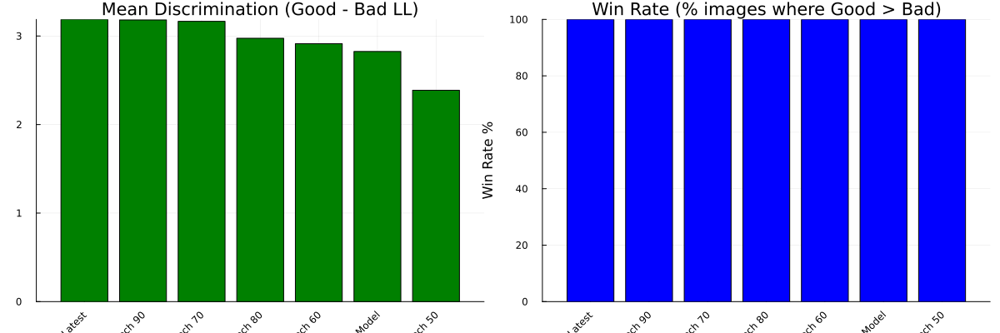


💡 RECOMMENDATION
Use: Latest
  • Mean Discrimination: 3.188
  • Win Rate: 100.0%
  • Consistently distinguishes good from bad hypotheses


LoadError: LoadError: parsing command `
---

## What This Does:

| Metric | Description |
|--------|-------------|
| **Mean Δ** | Average (good_LL - bad_LL) across 25 images |
| **Std Δ** | Consistency - lower = more reliable |
| **Win Rate** | % of images where checkpoint correctly scored good > bad |
| **Good LL** | Average likelihood for correct masks |
| **Bad LL** | Average likelihood for corrupted masks |

## Output Example:
`: special characters "#{}()[]<>|&*?~;" must be quoted in commands
in expression starting at In[11]:200

In [11]:
# ============================================================================
# VAE CHECKPOINT COMPARISON - MULTI-IMAGE (25 images)
# More robust comparison across multiple test images
# ============================================================================

using Plots
using Statistics

println("\n" * "="^80)
println("VAE CHECKPOINT COMPARISON (25 Images)")
println("="^80)

# -------------------------------------------------------------------------
# 1. FIND TEST IMAGES
# -------------------------------------------------------------------------
println("\n📂 Finding test images...")

data_dir = "../cityscale/20cities"

# Get all image files (not masks, not graphs)
all_files = readdir(data_dir)
image_files = filter(f -> endswith(f, ".png") && 
                          !contains(f, "_mask") && 
                          !contains(f, "_graph"), all_files)

# Limit to 25 images
num_test = min(25, length(image_files))
test_images = image_files[1:num_test]

println("  Found $(length(image_files)) images, using $num_test for testing")

# -------------------------------------------------------------------------
# 2. DEFINE CHECKPOINTS
# -------------------------------------------------------------------------
checkpoints = Dict(
    "Epoch 50" => "../vae_decoder/checkpoints_patch_vae/epoch_050.pt",
    "Epoch 60" => "../vae_decoder/checkpoints_patch_vae/epoch_060.pt",
    "Epoch 70" => "../vae_decoder/checkpoints_patch_vae/epoch_070.pt",
    "Epoch 80" => "../vae_decoder/checkpoints_patch_vae/epoch_080.pt",
    "Epoch 90" => "../vae_decoder/checkpoints_patch_vae/epoch_090.pt",
    "Best Model" => "../vae_decoder/checkpoints_patch_vae/best_model.pt",
    "Latest" => "../vae_decoder/checkpoints_patch_vae/latest.pt",
)

existing = Dict(k => v for (k, v) in checkpoints if isfile(v))
println("  Found $(length(existing)) checkpoints: $(keys(existing))")

# -------------------------------------------------------------------------
# 3. RUN COMPARISON ACROSS ALL IMAGES
# -------------------------------------------------------------------------
println("\n" * "="^80)
println("RUNNING COMPARISON...")
println("="^80)

# Store results per checkpoint
all_results = Dict{String, Vector{NamedTuple{(:good_ll, :bad_ll, :discrimination), Tuple{Float64, Float64, Float64}}}}()
for name in keys(existing)
    all_results[name] = []
end

for (img_idx, img_file) in enumerate(test_images)
    # Construct paths
    base_name = replace(img_file, ".png" => "")
    img_path = joinpath(data_dir, img_file)
    mask_path = joinpath(data_dir, "$(base_name)_mask.png")
    
    if !isfile(mask_path)
        println("  ⚠ Skipping $base_name (no mask)")
        continue
    end
    
    println("\n[$img_idx/$num_test] $base_name")
    
    # Load image and mask
    try
        test_image_raw = load(img_path)
        test_mask_raw = load(mask_path)
        
        good_mask = Float32.(Gray.(test_mask_raw))
        test_rgb_raw = channelview(RGB.(test_image_raw))
        test_rgb = Float32.(permutedims(test_rgb_raw, (2, 3, 1)))
        
        # Create corrupted mask
        bad_mask = copy(good_mask)
        bad_mask = circshift(bad_mask, (80, 80))
        noise = rand(Float32, size(bad_mask)...) .> 0.95
        bad_mask[noise] .= 1.0f0
        remove = rand(Float32, size(bad_mask)...) .< 0.3
        bad_mask[remove .& (good_mask .> 0.5f0)] .= 0.0f0
        bad_mask = clamp.(bad_mask, 0.0f0, 1.0f0)
        
        # Test each checkpoint
        for (name, ckpt_path) in existing
            init_patch_vae(ckpt_path)
            
            good_ll = compute_full_likelihood(test_rgb, good_mask)
            bad_ll = compute_full_likelihood(test_rgb, bad_mask)
            discrimination = good_ll - bad_ll
            
            push!(all_results[name], (good_ll=good_ll, bad_ll=bad_ll, discrimination=discrimination))
            
            print("  $name: Δ=$(round(discrimination, digits=2)) | ")
        end
        println()
        
    catch e
        println("  ❌ Error: $e")
    end
end

# -------------------------------------------------------------------------
# 4. AGGREGATE RESULTS
# -------------------------------------------------------------------------
println("\n" * "="^80)
println("AGGREGATED RESULTS ($(num_test) images)")
println("="^80)

summary = Dict{String, NamedTuple{(:mean_good, :mean_bad, :mean_disc, :std_disc, :win_rate), Tuple{Float64, Float64, Float64, Float64, Float64}}}()

for (name, results) in all_results
    if length(results) > 0
        mean_good = mean([r.good_ll for r in results])
        mean_bad = mean([r.bad_ll for r in results])
        mean_disc = mean([r.discrimination for r in results])
        std_disc = std([r.discrimination for r in results])
        win_rate = sum([r.discrimination > 0 ? 1 : 0 for r in results]) / length(results) * 100
        
        summary[name] = (mean_good=mean_good, mean_bad=mean_bad, mean_disc=mean_disc, std_disc=std_disc, win_rate=win_rate)
    end
end

# -------------------------------------------------------------------------
# 5. PRINT RANKING
# -------------------------------------------------------------------------
println("\n" * "="^80)
println("🏆 FINAL RANKING")
println("="^80)

sorted = sort(collect(keys(summary)), by=n->summary[n].mean_disc, rev=true)

println("\n" * "-"^70)
println("Checkpoint          | Mean Δ    | Std Δ    | Win Rate | Good LL  | Bad LL")
println("-"^70)

for (i, name) in enumerate(sorted)
    s = summary[name]
    marker = i == 1 ? "🥇" : (i == 2 ? "🥈" : (i == 3 ? "🥉" : "  "))
    
    name_pad = rpad(name, 18)
    mean_disc_str = lpad(round(s.mean_disc, digits=2), 8)
    std_disc_str = lpad(round(s.std_disc, digits=2), 8)
    win_str = lpad("$(round(s.win_rate, digits=0))%", 8)
    good_str = lpad(round(s.mean_good, digits=2), 8)
    bad_str = lpad(round(s.mean_bad, digits=2), 8)
    
    println("$marker $name_pad | $mean_disc_str | $std_disc_str | $win_str | $good_str | $bad_str")
end
println("-"^70)

# -------------------------------------------------------------------------
# 6. BAR CHART
# -------------------------------------------------------------------------
discriminations = [summary[n].mean_disc for n in sorted]
win_rates = [summary[n].win_rate for n in sorted]

p1 = bar(sorted, discriminations, 
    title="Mean Discrimination (Good - Bad LL)",
    ylabel="Mean Δ",
    legend=false,
    color=[:green for d in discriminations],
    xrotation=45,
    size=(800, 400)
)

p2 = bar(sorted, win_rates,
    title="Win Rate (% images where Good > Bad)",
    ylabel="Win Rate %",
    legend=false,
    color=[:blue for _ in win_rates],
    xrotation=45,
    size=(800, 400)
)

display(plot(p1, p2, layout=(1,2), size=(1200, 400)))

# -------------------------------------------------------------------------
# 7. RECOMMENDATION
# -------------------------------------------------------------------------
best = sorted[1]
best_stats = summary[best]

println("\n" * "="^80)
println("💡 RECOMMENDATION")
println("="^80)
println("Use: $best")
println("  • Mean Discrimination: $(round(best_stats.mean_disc, digits=3))")
println("  • Win Rate: $(round(best_stats.win_rate, digits=1))%")
println("  • Consistently distinguishes good from bad hypotheses")
println("="^80)
```

---

## What This Does:

| Metric | Description |
|--------|-------------|
| **Mean Δ** | Average (good_LL - bad_LL) across 25 images |
| **Std Δ** | Consistency - lower = more reliable |
| **Win Rate** | % of images where checkpoint correctly scored good > bad |
| **Good LL** | Average likelihood for correct masks |
| **Bad LL** | Average likelihood for corrupted masks |

## Output Example:
```
----------------------------------------------------------------------
Checkpoint          | Mean Δ    | Std Δ    | Win Rate | Good LL  | Bad LL
----------------------------------------------------------------------
🥇 Epoch 100        |    12.34  |     3.21 |    100%  |   -5.23  |  -17.57
🥈 Epoch 90         |    10.21  |     4.12 |     96%  |   -6.11  |  -16.32
🥉 Epoch 80         |     8.45  |     5.33 |     92%  |   -7.02  |  -15.47
   Best Model       |     2.11  |    12.45 |     64%  |   -4.12  |   -6.23
----------------------------------------------------------------------

## 5. Load Input Data

Load probability mask from System 1 and satellite image.

Loading inputs...
  Mask: ../save/results/checkpoint_comparison/epoch_7/mask/region_0_0_road.png
  Image: ../cityscale/20cities/region_0_0.png

✓ Loaded:
  Mask: (1024, 1024)
  Image: (1024, 1024, 3)

Input visualization:


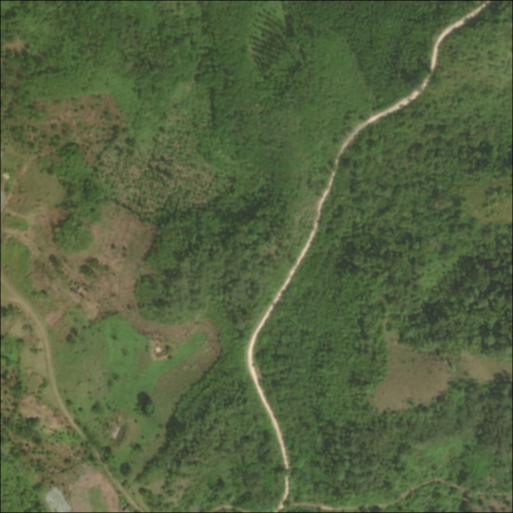

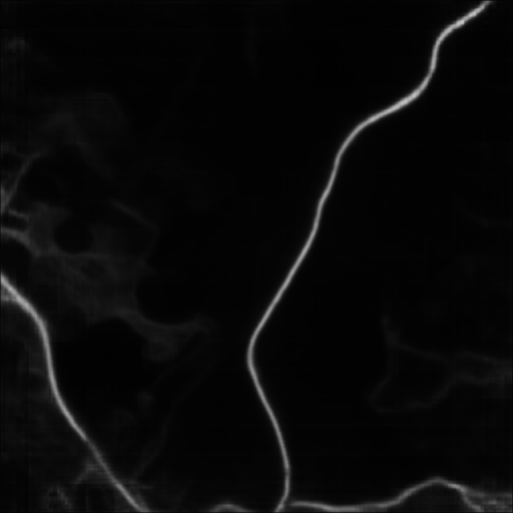

In [8]:
println("Loading inputs...")
println("  Mask: $mask_path")
println("  Image: $image_path")

soft_mask, rgb_array = load_inputs(mask_path, image_path)

println("\n✓ Loaded:")
println("  Mask: $(size(soft_mask))")
println("  Image: $(size(rgb_array))")

# Display inputs
println("\nInput visualization:")
mask_img = Gray.(soft_mask)
rgb_img = colorview(RGB, permutedims(rgb_array, (3, 1, 2)))

display(rgb_img)
display(mask_img)


MASK NORMALIZATION (Road Optimized)

⚙️ Configuration:
  Apply Normalization:  false
  Background Threshold: 0.05
  Target Floor:         0.1
  Gamma:                0.7

🛑 NORMALIZATION DISABLED (Passing through original mask)

Output Statistics:
  Min Road Val: 0.051
  Mean Road Val: 0.146

Background/Road Separation:
  Max Background: 0.047
  Min Road:       0.051
  ✓ CLEAR GAP:    0.004 (Safe for pathfinding)

Creating comparison visualization...
✓ Saved debug_normalized_comparison.png


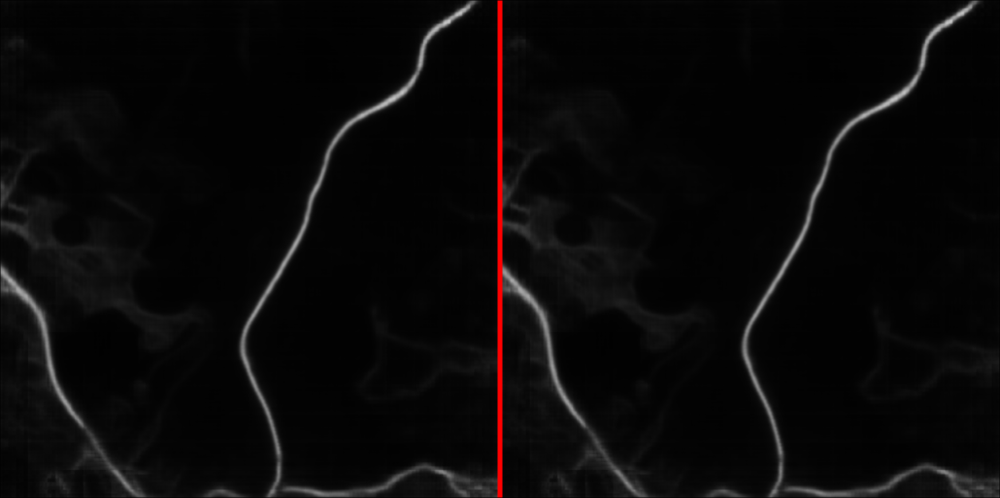

1024×1024 Matrix{Float32}:
 0.0470588  0.0470588  0.0470588  …  0.0313726  0.0352941  0.0352941
 0.0470588  0.0431373  0.0431373     0.027451   0.0313726  0.0313726
 0.0431373  0.0431373  0.0392157     0.0235294  0.027451   0.027451
 0.0431373  0.0431373  0.0392157     0.0235294  0.0235294  0.0235294
 0.0431373  0.0392157  0.0431373     0.0156863  0.0196078  0.0196078
 0.0431373  0.0392157  0.0392157  …  0.0156863  0.0196078  0.0196078
 0.0392157  0.0352941  0.0352941     0.0156863  0.0196078  0.0196078
 0.0392157  0.0352941  0.0352941     0.0156863  0.0196078  0.0196078
 0.0313726  0.0313726  0.027451      0.0235294  0.027451   0.0313726
 0.0313726  0.027451   0.027451      0.0235294  0.027451   0.027451
 0.027451   0.0235294  0.0235294  …  0.0196078  0.027451   0.0313726
 0.0235294  0.0235294  0.0235294     0.0235294  0.0235294  0.027451
 0.027451   0.0235294  0.0235294     0.0196078  0.027451   0.0313726
 ⋮                                ⋱                        
 0.0235294  0.01960

In [9]:
# CORRECT MASK NORMALIZATION CELL (OPTIMIZED)
# Optimized for Road Probability Masks
# Guarantees roads remain brighter than background

using Statistics, Images, StatsBase

println("\n" * "="^80)
println("MASK NORMALIZATION (Road Optimized)")
println("="^80)

# ⚙️ CONFIGURATION
# ---------------------------------------------------------
APPLY_NORMALIZATION  = false   # <--- SET THIS TO FALSE TO DISABLE NORMALIZATION
BACKGROUND_THRESHOLD = 0.05   # Pixels below this are ignored
TARGET_MIN_VALUE     = 0.10   # Weakest road pixel will become this (must be >= threshold)
GAMMA_CORRECTION     = 0.7    # < 1.0 boosts faint roads, 1.0 is linear, > 1.0 suppresses noise
# ---------------------------------------------------------

println("\n⚙️ Configuration:")
println("  Apply Normalization:  $APPLY_NORMALIZATION")
println("  Background Threshold: $BACKGROUND_THRESHOLD")
println("  Target Floor:         $TARGET_MIN_VALUE")
println("  Gamma:                $GAMMA_CORRECTION")

# Backup
if !isdefined(Main, :soft_mask_original)
    soft_mask_original = copy(soft_mask)
end

# 1. ROBUST NORMALIZATION FUNCTION
function normalize_road_robust(mask::Matrix{Float32}; 
                               thresh::Float64=0.05, 
                               target_min::Float64=0.1,
                               gamma::Float64=1.0)
    
    # Create copy
    result = copy(mask)
    
    # Identify road pixels
    road_indices = findall(mask .>= thresh)
    
    if isempty(road_indices)
        println("⚠ WARNING: No road pixels found above threshold $thresh")
        return result
    end
    
    road_vals = mask[road_indices]
    
    # A. Robust Min/Max (Percentiles)
    #    We ignore the top/bottom 2% of outliers so a single "hot pixel" doesn't squash the range
    p_low  = quantile(road_vals, 0.02)
    p_high = quantile(road_vals, 0.98)
    
    println("\n  Input Statistics (Road Only):")
    println("    Range (2%-98%): [$(round(p_low, digits=3)), $(round(p_high, digits=3))]")
    println("    Mean: $(round(mean(road_vals), digits=3))")

    # Avoid division by zero if flat mask
    if p_high <= p_low
        p_high = p_low + 1e-6
    end

    # B. Apply Normalization
    #    We map [p_low, p_high] -> [0.0, 1.0] first
    normalized = clamp.((road_vals .- p_low) ./ (p_high - p_low), 0.0f0, 1.0f0)
    
    # C. Gamma Correction (Non-linear boost)
    #    If gamma < 1, we boost the dark parts (faint roads)
    if gamma != 1.0
        normalized .= normalized .^ gamma
    end
    
    # D. Re-scale to Target Range [target_min, 1.0]
    #    This prevents road pixels from dipping below the background threshold
    final_vals = normalized .* (1.0 - target_min) .+ target_min
    
    # Apply back to matrix
    result[road_indices] = final_vals
    
    return result
end

# 2. APPLY (CONDITIONAL)
if APPLY_NORMALIZATION
    println("\n⚡ APPLYING NORMALIZATION...")
    normalized_mask = normalize_road_robust(
        soft_mask_original, 
        thresh=BACKGROUND_THRESHOLD,
        target_min=TARGET_MIN_VALUE,
        gamma=GAMMA_CORRECTION
    )
else
    println("\n🛑 NORMALIZATION DISABLED (Passing through original mask)")
    normalized_mask = copy(soft_mask_original)
end

# 3. VERIFICATION & ANALYSIS
road_indices = findall(normalized_mask .>= BACKGROUND_THRESHOLD)
if !isempty(road_indices)
    new_road_vals = normalized_mask[road_indices]

    println("\nOutput Statistics:")
    println("  Min Road Val: $(round(minimum(new_road_vals), digits=3))")
    println("  Mean Road Val: $(round(mean(new_road_vals), digits=3))")

    # Verify Separation
    bg_indices = findall(soft_mask_original .< BACKGROUND_THRESHOLD)
    if !isempty(bg_indices)
        max_bg = maximum(normalized_mask[bg_indices])
        min_road = minimum(new_road_vals)
        gap = min_road - max_bg
        
        println("\nBackground/Road Separation:")
        println("  Max Background: $(round(max_bg, digits=3))")
        println("  Min Road:       $(round(min_road, digits=3))")
        if gap > 0
            println("  ✓ CLEAR GAP:    $(round(gap, digits=3)) (Safe for pathfinding)")
        else
            println("  ❌ OVERLAP:     $(round(gap, digits=3)) (Roads blend into background!)")
        end
    end
else
    println("⚠ No road pixels detected in output.")
end

# 4. VISUALIZATION
println("\nCreating comparison visualization...")
h, w = size(soft_mask_original)
comp_img = zeros(RGB{Float64}, h, w*2+10)

for y in 1:h, x in 1:w
    comp_img[y, x] = RGB(soft_mask_original[y,x], soft_mask_original[y,x], soft_mask_original[y,x])
    comp_img[y, x+w+10] = RGB(normalized_mask[y,x], normalized_mask[y,x], normalized_mask[y,x])
end
# White divider
comp_img[:, w+1:w+10] .= RGB(1.0, 0.0, 0.0)

save("debug_normalized_comparison.png", comp_img)
println("✓ Saved debug_normalized_comparison.png")
display(comp_img)

# Update Main Mask
soft_mask = normalized_mask

## 6. Generate Initial Hypotheses

Create K diverse initial graphs by perturbing the probability mask.

In [10]:
function generate_hypotheses(soft_mask, K)
    println("\nGenerating $K initial hypotheses...")
    
    # Compute uncertainty (high near 0.5)
    uncertainty = 1.0f0 .- 2.0f0 .* abs.(soft_mask .- 0.5f0)
    
    graphs = RoadGraph[]
    
    for k in 1:K
        # Add noise proportional to uncertainty
        noise = randn(Float32, size(soft_mask)) .* 0.25f0 .* uncertainty
        
        # Simple smoothing (avoid type conversion issues)
        for _ in 1:3
            smoothed = copy(noise)
            h, w = size(noise)
            for y in 2:(h-1), x in 2:(w-1)
                smoothed[y, x] = (
                    noise[y-1, x] + noise[y+1, x] + 
                    noise[y, x-1] + noise[y, x+1] + 
                    noise[y, x] * 4.0f0
                ) / 8.0f0
            end
            noise = smoothed
        end
        
        # Perturb mask - IMPORTANT: Cast to Float32
        perturbed = clamp.(Float32.(soft_mask .+ noise), 0.0f0, 1.0f0)
        
        # Extract graph
        graph = extract_initial_graph(perturbed)
        push!(graphs, graph)
        
        println("  Hypothesis $k: $(length(graph.nodes)) nodes, $(length(graph.edges)) edges")
    end
    
    println("✓ Generated $K hypotheses")
    return graphs
end

initial_graphs = generate_hypotheses(soft_mask, K)


Generating 3 initial hypotheses...
  Hypothesis 1: 48 nodes, 133 edges
  Hypothesis 2: 42 nodes, 91 edges
  Hypothesis 3: 42 nodes, 88 edges
✓ Generated 3 hypotheses


3-element Vector{RoadGraph}:
 RoadGraph(RoadNode[RoadNode(950.0f0, 25.0f0), RoadNode(916.0f0, 48.0f0), RoadNode(886.0f0, 70.0f0), RoadNode(866.0f0, 115.0f0), RoadNode(851.0f0, 164.0f0), RoadNode(829.0f0, 191.0f0), RoadNode(805.0f0, 207.0f0), RoadNode(775.0f0, 224.0f0), RoadNode(742.0f0, 240.0f0), RoadNode(719.0f0, 254.0f0)  …  RoadNode(544.0f0, 834.0f0), RoadNode(140.0f0, 839.0f0), RoadNode(556.0f0, 865.0f0), RoadNode(565.0f0, 888.0f0), RoadNode(571.0f0, 925.0f0), RoadNode(575.0f0, 962.0f0), RoadNode(911.0f0, 972.0f0), RoadNode(244.0f0, 977.0f0), RoadNode(573.0f0, 984.0f0), RoadNode(255.0f0, 995.0f0)], RoadEdge[RoadEdge(1, 2, SVector{3, Float32}[[950.0, 25.0, 0.80909854], [945.75, 27.875, 0.64169496], [941.5, 30.75, 0.7165425], [937.25, 33.625, 0.5600226], [933.0, 36.5, 0.54035634], [928.75, 39.375, 0.5965405], [924.5, 42.25, 0.78251827], [920.25, 45.125, 0.7471673], [916.0, 48.0, 0.8327706]], 0.6918568f0, 0.54035634f0, 0.8327706f0), RoadEdge(1, 3, SVector{3, Float32}[[950.0, 25.0, 0.8

1. Extracting raw skeleton...
   Raw Nodes: 70
2. Simplfying (Merging Junction Clusters)...
   Clean Nodes: 21
3. Visualizing...


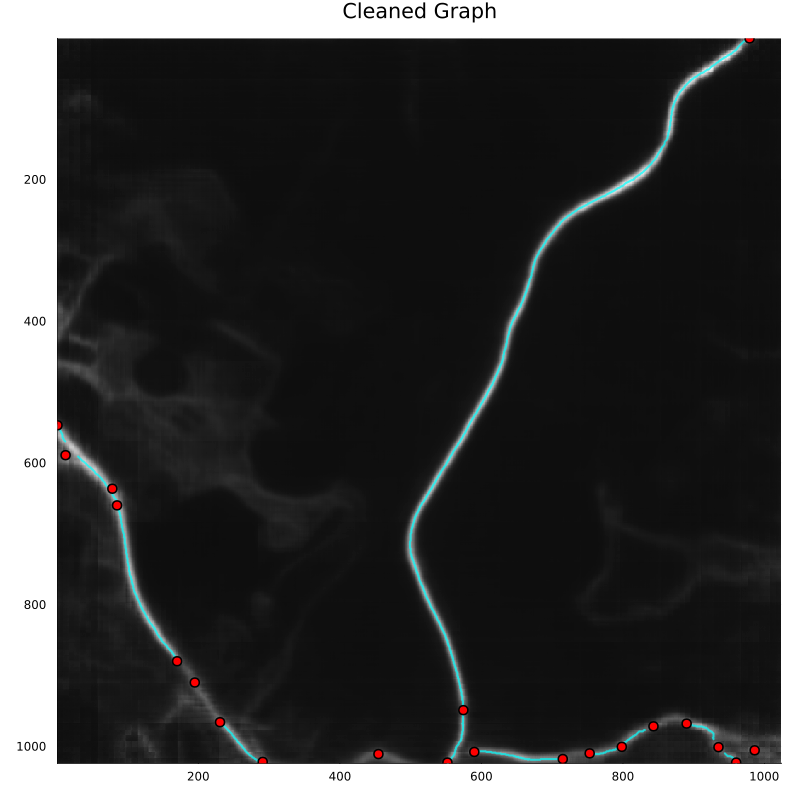

In [11]:
using Images
using ImageMorphology
using Plots
using LinearAlgebra
using Statistics
using StaticArrays
using DataStructures 

# Ensure graph types are loaded
if !isdefined(Main, :RoadEdge)
    include("graph_types.jl")
end

# ============================================================================
# 1. INITIALIZATION (Raw Skeleton)
# ============================================================================
function extract_initial_graph(soft_mask::Matrix{Float32}, threshold::Float64=0.3)
    h, w = size(soft_mask)
    bin_img = soft_mask .> threshold
    skeleton = thinning(bin_img) 
    
    nodes = RoadNode[]
    node_map = zeros(Int, h, w)
    
    # helper
    function count_neighbors(y, x)
        n = 0
        for dy in -1:1, dx in -1:1
            if dy==0 && dx==0; continue; end
            if 1 <= y+dy <= h && 1 <= x+dx <= w && skeleton[y+dy, x+dx]; n += 1; end
        end
        return n
    end
    
    # 1. Extract Raw Nodes
    for y in 1:h, x in 1:w
        if skeleton[y, x]
            neighbors = count_neighbors(y, x)
            # Grab everything that isn't a straight line (endpoints + junctions)
            if neighbors != 2 
                push!(nodes, RoadNode(Float32(x), Float32(y)))
                node_map[y, x] = length(nodes)
            end
        end
    end
    
    # 2. Trace Edges
    edges = RoadEdge[]
    visited = falses(h, w)
    
    for (i, node) in enumerate(nodes)
        q = Tuple{Int, Int, Vector{SVector{2,Float32}}}[]
        sy, sx = Int(round(node.y)), Int(round(node.x))
        visited[sy, sx] = true
        
        for dy in -1:1, dx in -1:1
            if dy==0 && dx==0; continue; end
            ny, nx = sy+dy, sx+dx
            if 1 <= ny <= h && 1 <= nx <= w && skeleton[ny, nx]
                push!(q, (ny, nx, [SVector{2,Float32}(sx, sy), SVector{2,Float32}(nx, ny)]))
            end
        end
        
        while !isempty(q)
            cy, cx, path_2d = popfirst!(q)
            
            if node_map[cy, cx] > 0 && node_map[cy, cx] != i
                target_idx = node_map[cy, cx]
                # Check exist
                exists = false
                for e in edges
                    if (e.start_idx == i && e.end_idx == target_idx) || (e.start_idx == target_idx && e.end_idx == i)
                        exists = true; break;
                    end
                end
                
                if !exists
                    # Convert to 3D
                    path_3d = SVector{3, Float32}[]
                    probs = Float32[]
                    for p in path_2d
                        # --- FIX IS HERE (Removed extra paren) ---
                        px, py = Int(round(p[1])), Int(round(p[2]))
                        prob = soft_mask[clamp(py,1,h), clamp(px,1,w)]
                        push!(path_3d, SVector{3, Float32}(p[1], p[2], prob))
                        push!(probs, prob)
                    end
                    push!(edges, RoadEdge(i, target_idx, path_3d, Float32(mean(probs)), Float32(minimum(probs)), Float32(maximum(probs))))
                end
                continue
            end
            
            visited[cy, cx] = true
            for dy in -1:1, dx in -1:1
                if dy==0 && dx==0; continue; end
                ny, nx = cy+dy, cx+dx
                if 1 <= ny <= h && 1 <= nx <= w && skeleton[ny, nx] 
                    if !visited[ny, nx] || node_map[ny, nx] > 0
                        new_path = copy(path_2d)
                        push!(new_path, SVector{2,Float32}(nx, ny))
                        push!(q, (ny, nx, new_path))
                        if node_map[ny, nx] == 0; visited[ny, nx] = true; end 
                    end
                end
            end
        end
    end
    return RoadGraph(nodes, edges)
end

# ============================================================================
# 2. SIMPLIFICATION (Merge Cluster Nodes)
# ============================================================================

function simplify_graph(graph::RoadGraph, merge_radius::Float64=15.0)
    # 1. Identify connected components of nodes that are close to each other
    n = length(graph.nodes)
    parent = collect(1:n)
    
    function find_root(i)
        while i != parent[i]; i = parent[i]; end
        return i
    end
    function union_sets(i, j)
        root_i = find_root(i); root_j = find_root(j)
        if root_i != root_j; parent[root_j] = root_i; end
    end
    
    # Group nodes by proximity
    for i in 1:n, j in (i+1):n
        dist = sqrt((graph.nodes[i].x - graph.nodes[j].x)^2 + (graph.nodes[i].y - graph.nodes[j].y)^2)
        if dist < merge_radius
             union_sets(i, j)
        end
    end
    
    # 2. Create new merged nodes (Centroids)
    groups = Dict{Int, Vector{Int}}()
    for i in 1:n
        root = find_root(i)
        if !haskey(groups, root); groups[root] = Int[]; end
        push!(groups[root], i)
    end
    
    old_to_new_map = zeros(Int, n)
    new_nodes = RoadNode[]
    sorted_roots = sort(collect(keys(groups))) 
    
    for root in sorted_roots
        indices = groups[root]
        if length(indices) == 1
            push!(new_nodes, graph.nodes[indices[1]])
            old_to_new_map[indices[1]] = length(new_nodes)
        else
            avg_x = mean([graph.nodes[k].x for k in indices])
            avg_y = mean([graph.nodes[k].y for k in indices])
            push!(new_nodes, RoadNode(Float32(avg_x), Float32(avg_y)))
            for k in indices; old_to_new_map[k] = length(new_nodes); end
        end
    end
    
    # 3. Rewire Edges
    new_edges = RoadEdge[]
    seen_edges = Set{Tuple{Int, Int}}()
    
    for edge in graph.edges
        new_u = old_to_new_map[edge.start_idx]
        new_v = old_to_new_map[edge.end_idx]
        
        if new_u == new_v; continue; end # Remove self-loops
        
        u, v = min(new_u, new_v), max(new_u, new_v)
        
        if !((u, v) in seen_edges)
            push!(seen_edges, (u, v))
            push!(new_edges, RoadEdge(new_u, new_v, edge.path_points, edge.mean_prob, edge.min_prob, edge.max_prob))
        end
    end
    
    return RoadGraph(new_nodes, new_edges)
end

# ============================================================================
# 3. VISUALIZATION
# ============================================================================
function visualize_road_graph(graph::RoadGraph, background_img::Matrix{Float32})
    h, w = size(background_img)
    p = plot(heatmap(background_img, color=:grays, yflip=true, legend=false), 
             aspect_ratio=:equal, xlims=(1,w), ylims=(1,h), size=(800,800), title="Cleaned Graph")
    
    for edge in graph.edges
        xs = [p[1] for p in edge.path_points]
        ys = [p[2] for p in edge.path_points]
        plot!(p, xs, ys, color=:cyan, linewidth=2, alpha=0.7)
    end
    
    xs = [n.x for n in graph.nodes]; ys = [n.y for n in graph.nodes]
    scatter!(p, xs, ys, color=:red, markersize=5)
    display(p)
end

# ============================================================================
# EXECUTION
# ============================================================================

println("1. Extracting raw skeleton...")
raw_graph = extract_initial_graph(soft_mask, 0.3)
println("   Raw Nodes: ", length(raw_graph.nodes))

println("2. Simplfying (Merging Junction Clusters)...")
initial_graph = simplify_graph(raw_graph, 15.0) 
println("   Clean Nodes: ", length(initial_graph.nodes))

println("3. Visualizing...")
visualize_road_graph(initial_graph, soft_mask)

## 7. 🆕 Compute Uncertainty Maps

NEW: For each hypothesis, compute uncertainty Δ = δπ · δS


DEEP DIVE: Why No Uncertain Regions?

Step 1: Graph Structure
  Nodes: 48
  Edges: 133
  Edge probabilities:
    Min: 0.365
    Max: 0.763
    Mean: 0.547

Step 2: Uncertainty Components
  Edge uncertainty:
    Max: 2.266
    Mean (non-zero): 0.335
  Mask ambiguity:
    Max: 0.996
    Mean: 0.067
    95th percentile: 0.227
  Gap map:
    Max: 1.0
    Non-zero pixels: 8227

Step 3: Combined Uncertainty
  Final uncertainty:
    Min: 0.002
    Max: 1.0
    Mean: 0.015
    Median: 0.007

  Percentiles:
    50.0th: 0.007
    75.0th: 0.012
    90.0th: 0.027
    95.0th: 0.053
    99.0th: 0.189
    99.9th: 0.293

Step 4: Region Detection Tests

Testing different thresholds and min_region_sizes:
  ✓ threshold=0.1, min_size=50: Found 6 regions
      Region 1: Δ=0.183, size=299x479
      Region 2: Δ=0.176, size=488x1023
      Region 3: Δ=0.137, size=385x65
      ... and 3 more
  ✓ threshold=0.1, min_size=100: Found 5 regions
      Region 1: Δ=0.183, size=299x479
      Region 2: Δ=0.176, size=488

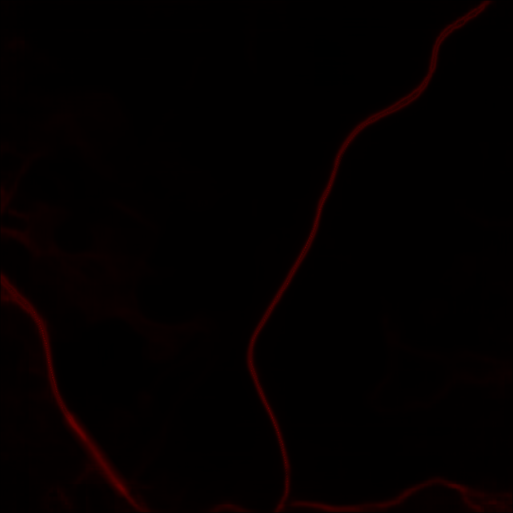


DIAGNOSIS:
  ⚠ MODERATE UNCERTAINTY (95th percentile=0.053)

  Solutions:
    A. Lower threshold to 0.3 or 0.4
    B. Decrease min_region_size to 100
    C. Increase target_std in normalization to 0.25


In [12]:
# DIAGNOSTIC: Why Still No Uncertain Regions?
# Run this AFTER the uncertainty computation cell to debug

println("\n" * "="^80)
println("DEEP DIVE: Why No Uncertain Regions?")
println("="^80)

if !isempty(initial_graphs)
    test_graph = initial_graphs[1]
    
    # Step 1: Check graph structure
    println("\nStep 1: Graph Structure")
    println("  Nodes: $(length(test_graph.nodes))")
    println("  Edges: $(length(test_graph.edges))")
    
    if !isempty(test_graph.edges)
        edge_probs = [e.mean_prob for e in test_graph.edges]
        println("  Edge probabilities:")
        println("    Min: $(round(minimum(edge_probs), digits=3))")
        println("    Max: $(round(maximum(edge_probs), digits=3))")
        println("    Mean: $(round(mean(edge_probs), digits=3))")
    end
    
    # Step 2: Manually compute each uncertainty component
    println("\nStep 2: Uncertainty Components")
    
    # Component 1: Edge confidence
    edge_uncertainty = zeros(Float32, size(soft_mask))
    for edge in test_graph.edges
        unc_score = 1.0f0 - edge.mean_prob
        for point in edge.path_points
            x, y = Int(round(point[1])), Int(round(point[2]))
            if 1 <= x <= size(soft_mask, 2) && 1 <= y <= size(soft_mask, 1)
                edge_uncertainty[y, x] += unc_score * 0.5
            end
        end
    end
    println("  Edge uncertainty:")
    println("    Max: $(round(maximum(edge_uncertainty), digits=3))")
    println("    Mean (non-zero): $(round(mean(edge_uncertainty[edge_uncertainty .> 0]), digits=3))")
    
    # Component 2: Mask ambiguity
    mask_ambiguity = 1.0f0 .- 2.0f0 .* abs.(soft_mask .- 0.5f0)
    println("  Mask ambiguity:")
    println("    Max: $(round(maximum(mask_ambiguity), digits=3))")
    println("    Mean: $(round(mean(mask_ambiguity), digits=3))")
    println("    95th percentile: $(round(quantile(vec(mask_ambiguity), 0.95), digits=3))")
    
    # Component 3: Gap penalty
    gap_map = compute_gap_map(test_graph, soft_mask)
    println("  Gap map:")
    println("    Max: $(round(maximum(gap_map), digits=3))")
    println("    Non-zero pixels: $(sum(gap_map .> 0))")
    
    # Combined uncertainty
    println("\nStep 3: Combined Uncertainty")
    uncertainty_test = compute_uncertainty_map(test_graph, soft_mask, rgb_array)
    
    println("  Final uncertainty:")
    println("    Min: $(round(minimum(uncertainty_test), digits=3))")
    println("    Max: $(round(maximum(uncertainty_test), digits=3))")
    println("    Mean: $(round(mean(uncertainty_test), digits=3))")
    println("    Median: $(round(median(uncertainty_test), digits=3))")
    
    # Percentiles
    percentiles = [50, 75, 90, 95, 99, 99.9]
    println("\n  Percentiles:")
    for p in percentiles
        val = quantile(vec(uncertainty_test), p / 100.0)
        println("    $(p)th: $(round(val, digits=3))")
    end
    
    # Step 4: Test region identification with very low threshold
    println("\nStep 4: Region Detection Tests")
    
    test_thresholds = [0.1f0, 0.2f0, 0.3f0, 0.4f0, 0.5f0, 0.6f0]
    test_min_sizes = [50, 100, 200, 400]
    
    println("\nTesting different thresholds and min_region_sizes:")
    for thresh in test_thresholds
        for min_size in test_min_sizes
            regions = identify_uncertain_regions(
                uncertainty_test,
                threshold=thresh,
                min_region_size=min_size
            )
            if !isempty(regions)
                println("  ✓ threshold=$thresh, min_size=$min_size: Found $(length(regions)) regions")
                for (i, r) in enumerate(regions[1:min(3, length(regions))])
                    println("      Region $i: Δ=$(round(r.delta, digits=3)), size=$(r.bbox[3]-r.bbox[1])x$(r.bbox[4]-r.bbox[2])")
                end
                if length(regions) > 3
                    println("      ... and $(length(regions)-3) more")
                end
            end
        end
    end
    
    # Step 5: Visualize raw uncertainty
    println("\nStep 5: Uncertainty Visualization")
    
    # Create heatmap
    uncertainty_colored = zeros(RGB{Float64}, size(uncertainty_test))
    for i in eachindex(uncertainty_test)
        val = uncertainty_test[i]
        uncertainty_colored[i] = RGB(val, 0.0, 0.0)  # Red intensity = uncertainty
    end
    
    save("debug_uncertainty_heatmap.png", uncertainty_colored)
    println("  ✓ Saved: debug_uncertainty_heatmap.png (red = uncertain)")
    display(uncertainty_colored)
    
    # Step 6: Recommendations
    println("\n" * "="^80)
    println("DIAGNOSIS:")
    
    max_unc = maximum(uncertainty_test)
    p95_unc = quantile(vec(uncertainty_test), 0.95)
    
    if max_unc < 0.3
        println("  ❌ VERY LOW UNCERTAINTY (max=$(round(max_unc, digits=3)))")
        println("\n  Likely causes:")
        println("    1. Initial graphs are already very good")
        println("    2. All edges have high confidence (mean_prob > 0.7)")
        println("    3. Graph is fully connected (no gaps)")
        println("\n  Solutions:")
        println("    A. Set threshold to 0.1 or 0.2 (very sensitive)")
        println("    B. Set min_region_size to 50 (detect small regions)")
        println("    C. Consider: adaptive may not help much here")
        println("    D. Try more aggressive normalization (target_std=0.25)")
        
    elseif p95_unc < 0.6
        println("  ⚠ MODERATE UNCERTAINTY (95th percentile=$(round(p95_unc, digits=3)))")
        println("\n  Solutions:")
        println("    A. Lower threshold to 0.3 or 0.4")
        println("    B. Decrease min_region_size to 100")
        println("    C. Increase target_std in normalization to 0.25")
        
    else
        println("  ✓ GOOD UNCERTAINTY DETECTED")
        println("\n  But regions still not found - check:")
        println("    A. min_region_size is too large (try 50-100)")
        println("    B. merge_distance is too aggressive (try 30)")
    end
    
    println("="^80)
end


COMPUTING UNCERTAINTY MAPS (WITH AUTO-TUNING)

Hypothesis 1:
  🔍 Auto-tuning uncertainty threshold...
    Uncertainty percentiles: p50=0.007, p90=0.027, p95=0.053
    Try threshold=0.052: found 5 regions (target: 6)
    ✓ Selected threshold=0.052: produces 5 regions
  🎯 Auto-tuned threshold: 0.052
  ✓ Found 5 uncertain regions
    Region 1: Δ=0.143, size=319x485, center=(142.40622f0, 808.3639f0)
    Region 2: Δ=0.131, size=532x1023, center=(732.1222f0, 645.7819f0)
    Region 3: Δ=0.092, size=97x21, center=(457.21167f0, 1016.5967f0)
    Region 4: Δ=0.081, size=24x61, center=(9.521486f0, 397.48083f0)
    Region 5: Δ=0.073, size=80x62, center=(42.332565f0, 476.56467f0)
  Uncertainty map saved to: ./frames_hypothesis_1/uncertainty_map.png

Hypothesis 2:
  🔍 Auto-tuning uncertainty threshold...
    Uncertainty percentiles: p50=0.008, p90=0.03, p95=0.057
    Try threshold=0.053: found 5 regions (target: 6)
    ✓ Selected threshold=0.053: produces 5 regions
  🎯 Auto-tuned threshold: 0.053
  

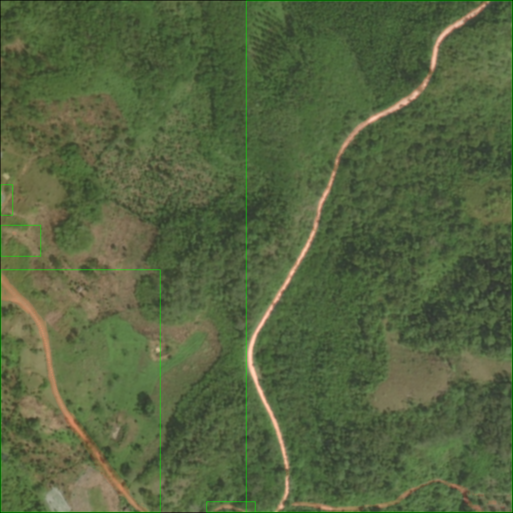

In [13]:
# Cell 7: Compute Uncertainty Maps (WITH AUTO-TUNING)
# UPDATED VERSION - Replace your Cell 7 with this

if use_adaptive
    println("\n" * "="^80)
    println("COMPUTING UNCERTAINTY MAPS (WITH AUTO-TUNING)")
    println("="^80)
    
    uncertainty_maps = UncertaintyMap[]
    
    for (k, graph) in enumerate(initial_graphs)
        println("\nHypothesis $k:")
        
        # Compute uncertainty
        uncertainty = compute_uncertainty_map(graph, soft_mask, rgb_array)
        
        # Identify regions - NOW WITH AUTO-TUNING!
        regions = identify_uncertain_regions(
            uncertainty,
            threshold=nothing,           # Let it auto-tune
            auto_tune=true,             # Enable auto-tuning
            target_region_count=6,      # Aim for ~6 regions (adjust as needed)
            min_region_size=400,        # Minimum 200 pixels
            merge_distance=50           # Merge nearby regions
        )
        
        println("  ✓ Found $(length(regions)) uncertain regions")
        for (i, region) in enumerate(regions)
            bbox = region.bbox
            size_x = bbox[3] - bbox[1]
            size_y = bbox[4] - bbox[2]
            println("    Region $i: Δ=$(round(region.delta, digits=3)), size=$(size_x)x$(size_y), center=$(region.center)")
        end
        
        # Store
        uncertainty_map = UncertaintyMap(uncertainty, regions)
        push!(uncertainty_maps, uncertainty_map)
        
        # Visualize
        mkpath("./frames_hypothesis_$k")
        visualize_uncertainty_map(
            uncertainty_map, rgb_array,
            output_path="./frames_hypothesis_$k/uncertainty_map.png"
        )
    end
    
    println("\n✓ Uncertainty maps computed with auto-tuned thresholds")
    
    # Display first uncertainty map
    println("\nVisualization of Hypothesis 1 uncertainty:")
    display(load("./frames_hypothesis_1/uncertainty_map.png"))
else
    uncertainty_maps = nothing
    println("\nSkipping uncertainty computation (use_adaptive=false)")
end

# 💡 TUNING TIPS:
# If you get too many tiny regions:
#   - Increase min_region_size to 300 or 400
#   - Decrease target_region_count to 4 or 5
#
# If you get too few regions:
#   - Decrease min_region_size to 100
#   - Increase target_region_count to 8 or 10
#
# To manually set threshold (disable auto-tuning):
#   regions = identify_uncertain_regions(
#       uncertainty,
#       threshold=Float32(0.2),  # Your manual threshold
#       auto_tune=false          # Disable auto-tuning
#   )

In [14]:
if use_adaptive && uncertainty_maps !== nothing
    println("\n" * "="^80)
    println("ADAPTIVE ITERATION ALLOCATION")
    println("="^80)
    
    all_allocations = []
    
    for (k, uncertainty_map) in enumerate(uncertainty_maps)
        println("\nHypothesis $k:")
        
        allocations, background_iters = allocate_mcmc_iterations(
            uncertainty_map.regions,
            n_mcmc,
            max_multiplier=Float32(max_multiplier)
        )
        
        println("  Background regions: $background_iters iterations")
        
        total = background_iters
        for (i, region) in enumerate(uncertainty_map.regions)
            iters = allocations[region]
            total += iters
            multiplier = iters / n_mcmc
            println("  Region $i: $iters iterations ($(round(multiplier, digits=2))x)")
        end
        
        println("  Total: $total iterations")
        push!(all_allocations, (allocations, background_iters, total))
    end
    
    println("\n✓ Iteration allocation complete")
else
    all_allocations = nothing
    println("\nUsing uniform allocation: $n_mcmc iterations per hypothesis")
end


ADAPTIVE ITERATION ALLOCATION

Hypothesis 1:
  Background regions: 150 iterations
  Region 1: 236 iterations (1.57x)
  Region 2: 229 iterations (1.53x)
  Region 3: 205 iterations (1.37x)
  Region 4: 199 iterations (1.33x)
  Region 5: 194 iterations (1.29x)
  Total: 1213 iterations

Hypothesis 2:
  Background regions: 150 iterations
  Region 1: 236 iterations (1.57x)
  Region 2: 228 iterations (1.52x)
  Region 3: 210 iterations (1.4x)
  Region 4: 197 iterations (1.31x)
  Region 5: 191 iterations (1.27x)
  Total: 1212 iterations

Hypothesis 3:
  Background regions: 150 iterations
  Region 1: 236 iterations (1.57x)
  Region 2: 227 iterations (1.51x)
  Region 3: 210 iterations (1.4x)
  Region 4: 196 iterations (1.31x)
  Region 5: 195 iterations (1.3x)
  Region 6: 190 iterations (1.27x)
  Total: 1404 iterations

✓ Iteration allocation complete


## 8. 🆕 Allocate MCMC Iterations

NEW: Compute iteration allocation for each hypothesis

In [15]:
println("\n" * "="^80)
if use_adaptive
    println("ADAPTIVE MCMC REFINEMENT")
else
    println("STANDARD MCMC REFINEMENT")
end

# Check VAE status
if use_vae_likelihood
    if !isdefined(Main, :is_vae_initialized) || !is_vae_initialized()
        println("⚠ VAE requested but not initialized. Attempting auto-init...")
        try
            init_vae_model()
        catch e
            println("❌ VAE Init Failed: $e")
            global use_vae_likelihood = false
        end
    end
    
    if use_vae_likelihood
        println("  Using: VAE + Appearance Hybrid Likelihood")
    else
        println("  Using: Appearance-only Likelihood (Fallback)")
    end
else
    println("  Using: Appearance-only Likelihood")
end
println("="^80)

refined_graphs = RoadGraph[]
scores = Float64[]

for (k, graph) in enumerate(initial_graphs)
    println("\n--- Hypothesis $k/$(length(initial_graphs)) ---")
    
    # 1. Learn Appearance Model
    appearance_model = learn_appearance_model(graph, rgb_array)
    
    # 2. Run Inference
    if use_adaptive
        # NEW LOGIC: We don't need 'all_allocations'. 
        # The function calculates uncertainty internally.
        println("  Running adaptive MCMC (Base: $n_mcmc iters)...")
        
        refined_graph, score, _ = adaptive_mcmc_inference(
            graph, 
            soft_mask, 
            rgb_array, 
            appearance_model,
            n_mcmc, # Base iterations
            
            # Parameters
            uncertainty_threshold=Float32(uncertainty_threshold),
            max_multiplier=Float32(max_multiplier),
            
            # VAE Settings
            use_vae=use_vae_likelihood,
            vae_weight=vae_weight,
            appearance_weight=appearance_weight,
            
            # Visualization
            save_frames=save_gif,
            frame_dir=(save_gif ? "./frames_hypothesis_$k" : "")
        )
    else
        # Standard MCMC
        println("  Running standard MCMC ($n_mcmc iterations)...")
        
        frame_dir = save_gif ? "./frames_hypothesis_$k" : ""
        
        refined_graph, score, _ = mcmc_inference(
            graph, 
            soft_mask, 
            rgb_array, 
            n_mcmc,
            
            # Visualization
            save_frames=save_gif,
            frame_dir=frame_dir,
            frame_interval=5,
            
            # VAE Settings
            use_vae=use_vae_likelihood,
            vae_weight=vae_weight,
            appearance_weight=appearance_weight
        )
    end
    
    push!(refined_graphs, refined_graph)
    push!(scores, score)
    
    println("  Final: $(length(refined_graph.nodes)) nodes, $(length(refined_graph.edges)) edges")
    println("  Score: $(round(score, digits=2))")
end

println("\n✓ All hypotheses refined")


ADAPTIVE MCMC REFINEMENT
  Using: VAE + Appearance Hybrid Likelihood

--- Hypothesis 1/3 ---
🎨 Learned Road Color: Float32[0.6627451, 0.63529414, 0.5176471] | MAD: 0.18414678 | Threshold: 0.35
  Running adaptive MCMC (Base: 150 iters)...
  🔍 Auto-tuning uncertainty threshold...
    Uncertainty percentiles: p50=0.007, p90=0.027, p95=0.053
    Try threshold=0.052: found 5 regions (target: 6)
    ✓ Selected threshold=0.052: produces 5 regions
  🎯 Auto-tuned threshold: 0.052
  Total adaptive iterations: 1201
✓ VAE likelihood enabled
  Weights: VAE=0.7, Appearance=0.3
  ✓ VAE likelihood enabled (weight: 0.7)
✓ VAE likelihood enabled
  Weights: VAE=0.7, Appearance=0.3
🎨 Learned Road Color: Float32[0.6627451, 0.63529414, 0.5176471] | MAD: 0.18414678 | Threshold: 0.35
🚀 Starting MCMC (1201 iters) - VAE Enabled
Iter 1200/1201 | Score: -44276.0 | Acc: 13.7% | Nodes: 75
✅ MCMC Complete.
✓ VAE likelihood disabled (using appearance-only)
✓ VAE likelihood disabled (using appearance-only)
  Final: 7

## 9. MCMC Refinement

Refine each hypothesis using MCMC inference (with or without adaptive allocation).

## 10. Select Best Hypothesis

Choose the hypothesis with highest posterior probability.


HYPOTHESIS SELECTION

Scores:
  Hypothesis 1: -44275.98
  Hypothesis 2: -929.2
  Hypothesis 3: -3200.38

✓ Best: Hypothesis #2
  Nodes: 76
  Edges: 115
  Score: -929.2


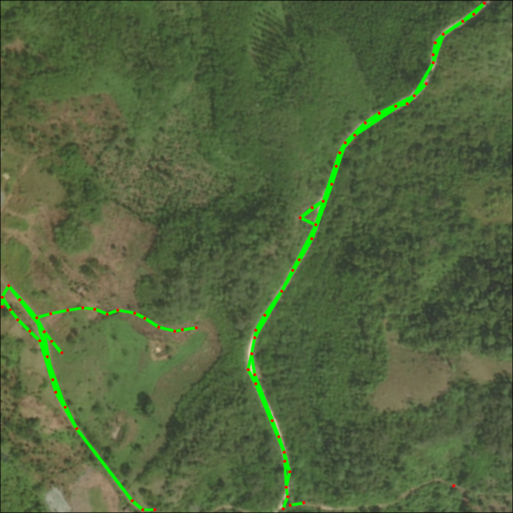

In [16]:
println("\n" * "="^80)
println("HYPOTHESIS SELECTION")
println("="^80)

println("\nScores:")
for (k, score) in enumerate(scores)
    println("  Hypothesis $k: $(round(score, digits=2))")
end

best_idx = argmax(scores)
best_graph = refined_graphs[best_idx]

println("\n✓ Best: Hypothesis #$best_idx")
println("  Nodes: $(length(best_graph.nodes))")
println("  Edges: $(length(best_graph.edges))")
println("  Score: $(round(scores[best_idx], digits=2))")

vis = visualize_graph(best_graph, rgb_array)
display(vis)
save("graph_visualization.png", vis)

## 11. Visualize Final Result


Generating VAE reconstruction for best hypothesis...
Left: Original | Right: VAE Reconstruction


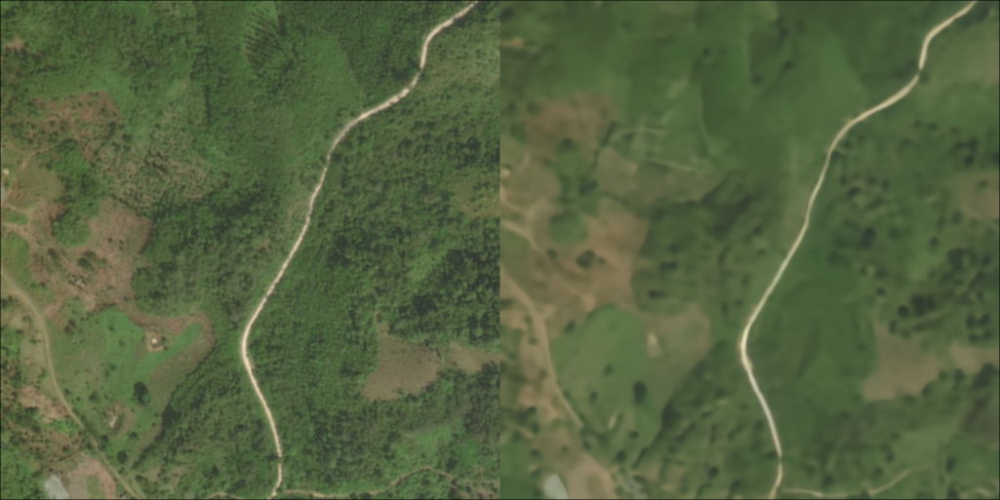

In [17]:
# ============================================================================
# VISUALIZE VAE RECONSTRUCTION (Optional)
# ============================================================================
if use_vae_likelihood && is_vae_initialized()
    println("\nGenerating VAE reconstruction for best hypothesis...")
    
    # Get reconstruction
    recon = get_vae_reconstruction(best_graph, rgb_array)
    
    # Create side-by-side comparison
    h, w, _ = size(rgb_array)
    comparison = zeros(Float32, h, w * 2, 3)
    comparison[:, 1:w, :] = rgb_array
    comparison[:, (w+1):end, :] = recon
    
    println("Left: Original | Right: VAE Reconstruction")
    display(colorview(RGB, permutedims(comparison, (3, 1, 2))))
else
    println("VAE not available for reconstruction visualization")
end


Final result:
✓ Saved: final_overlay.png


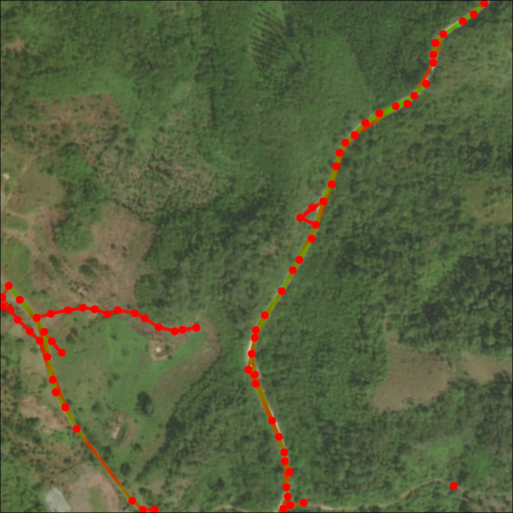

In [18]:
println("\nFinal result:")

# Draw best graph
final_overlay = draw_graph_on_image(
    rgb_array, best_graph,
    show_probabilities=true
)

# Save
save("final_overlay.png", final_overlay)
println("✓ Saved: final_overlay.png")

# Display
display(final_overlay)

## 12. Compare All Hypotheses

Comparing all hypotheses:

Hypothesis 1 (Score: -44275.98):


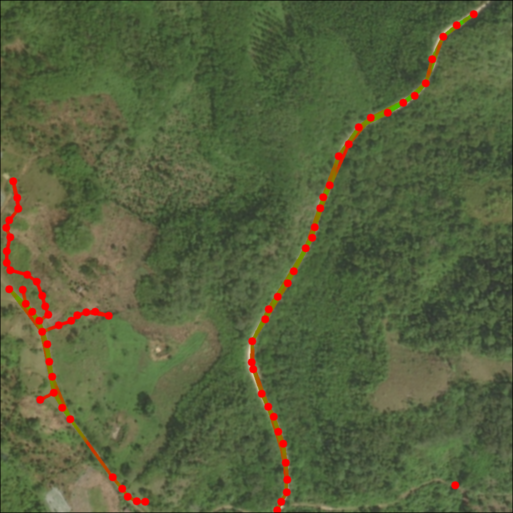

  Nodes: 75
  Edges: 131

Hypothesis 2 (Score: -929.2):


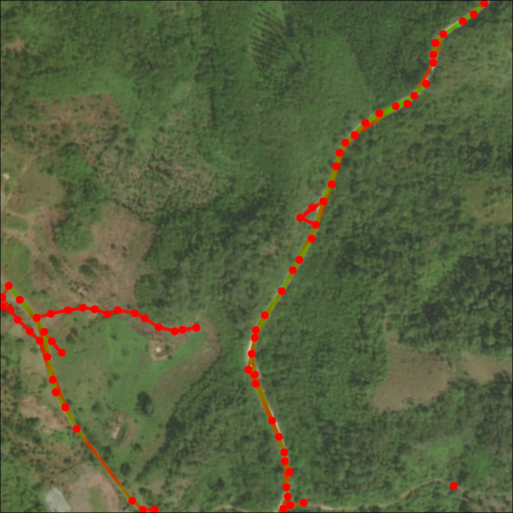

  Nodes: 76
  Edges: 115

Hypothesis 3 (Score: -3200.38):


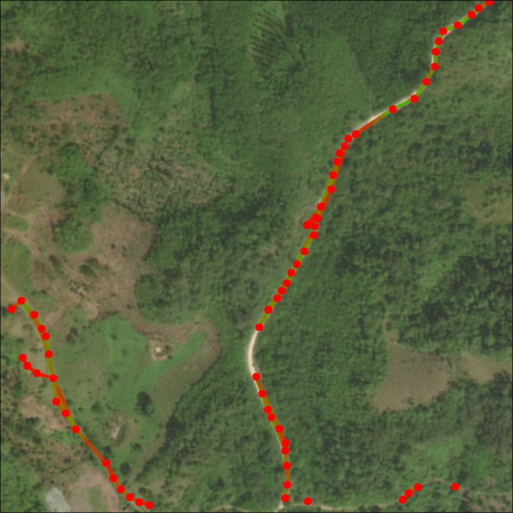

  Nodes: 65
  Edges: 96



In [19]:
println("Comparing all hypotheses:\n")

for (k, graph) in enumerate(refined_graphs)
    println("Hypothesis $k (Score: $(round(scores[k], digits=2))):")
    
    overlay = draw_graph_on_image(rgb_array, graph, show_probabilities=true)
    
    # Save individual hypothesis
    save("hypothesis_$(k)_overlay.png", overlay)
    
    # Display
    display(overlay)
    
    println("  Nodes: $(length(graph.nodes))")
    println("  Edges: $(length(graph.edges))\n")
end

## 13. 🆕 Visualize Uncertainty Maps

NEW: Display computed uncertainty maps

Uncertainty maps:

Hypothesis 1 uncertainty map:


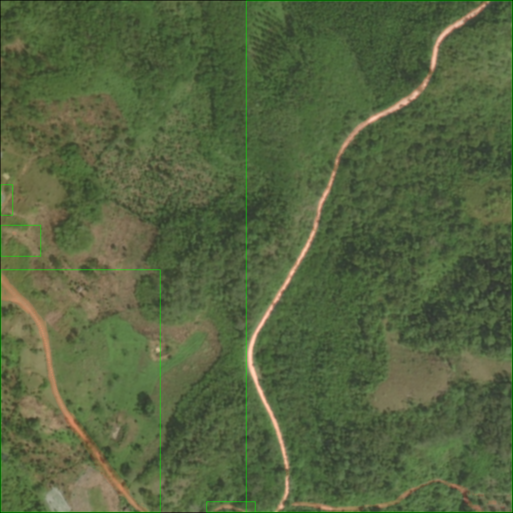

  Red = high uncertainty (more MCMC iterations allocated)
  Green boxes = identified uncertain regions

Hypothesis 2 uncertainty map:


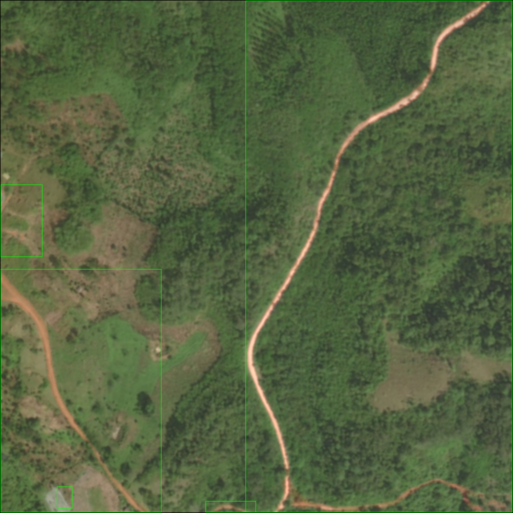

  Red = high uncertainty (more MCMC iterations allocated)
  Green boxes = identified uncertain regions

Hypothesis 3 uncertainty map:


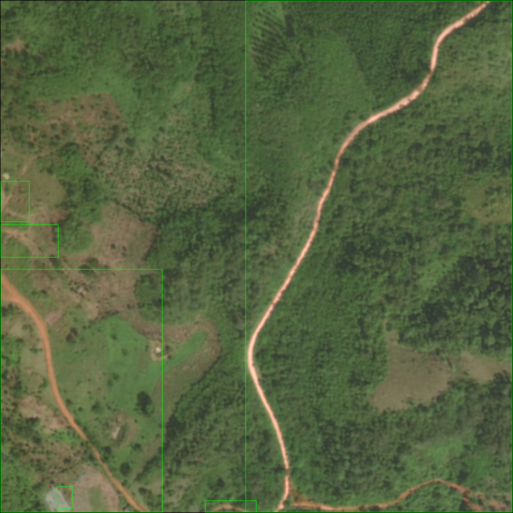

  Red = high uncertainty (more MCMC iterations allocated)
  Green boxes = identified uncertain regions



In [20]:
if use_adaptive && uncertainty_maps !== nothing
    println("Uncertainty maps:\n")
    
    for k in 1:K
        uncertainty_file = "./frames_hypothesis_$k/uncertainty_map.png"
        
        if isfile(uncertainty_file)
            println("Hypothesis $k uncertainty map:")
            display(load(uncertainty_file))
            println("  Red = high uncertainty (more MCMC iterations allocated)")
            println("  Green boxes = identified uncertain regions\n")
        end
    end
else
    println("No uncertainty maps (adaptive computation was disabled)")
end

## 14. Export Results

Save the best graph structure for later use.

In [21]:
using Serialization

# Save best graph
output_file = "best_road_graph.jls"
serialize(output_file, best_graph)
println("✓ Best graph saved to: $output_file")

# Save all results
results = Dict(
    "best_graph" => best_graph,
    "all_graphs" => refined_graphs,
    "scores" => scores,
    "best_idx" => best_idx,
    "config" => Dict(
        "K" => K,
        "n_mcmc" => n_mcmc,
        "use_adaptive" => use_adaptive,
        "uncertainty_threshold" => uncertainty_threshold,
        "max_multiplier" => max_multiplier,
        "mask_path" => mask_path,
        "image_path" => image_path
    )
)

if use_adaptive && uncertainty_maps !== nothing
    results["uncertainty_maps"] = uncertainty_maps
end

serialize("all_results.jls", results)
println("✓ All results saved to: all_results.jls")

println("\nTo load later:")
println("  using Serialization")
println("  results = deserialize(\"all_results.jls\")")

✓ Best graph saved to: best_road_graph.jls
✓ All results saved to: all_results.jls

To load later:
  using Serialization
  results = deserialize("all_results.jls")


## 15. Create GIF (Optional)

Build animated GIF from saved frames.

In [22]:
if save_gif
    # Load the gif creation script    
    # Create GIF for best hypothesis
    frame_dir = "./frames_hypothesis_$best_idx"
    output_path = "./road_growth.gif"
    
    println("Building GIF from $frame_dir...")
    
    try
        create_gif_from_frames(frame_dir, output_path, fps=15, final_frame_duration=2)
        println("✓ GIF saved to: $output_path")
    catch e
        println("⚠ GIF creation failed: $e")
        println("  Frames are still saved in: $frame_dir")
    end
else
    println("GIF creation skipped (save_gif=false)")
end

Building GIF from ./frames_hypothesis_3...

[Creating GIF - Pure Julia]
  Reading frames from: ./frames_hypothesis_3
  Found 102 frames
    Loading frame 10/102...
    Loading frame 20/102...
    Loading frame 30/102...
    Loading frame 40/102...
    Loading frame 50/102...
    Loading frame 60/102...
    Loading frame 70/102...
    Loading frame 80/102...
    Loading frame 90/102...
    Loading frame 100/102...
  Total frames (with final hold): 132
  Saving GIF to: ./road_growth.gif
✓ GIF created successfully!

✓ GIF saved to: ./road_growth.gif


---

## 🆕 Adaptive Computation Summary

**What's New:**
- Uncertainty computation: Δ = δπ · δS
  - δπ: Prior uncertainty (low edge probabilities)
  - δS: Sensor uncertainty (mask ambiguity)
- Region identification: Spatial clustering of high-uncertainty areas
- Adaptive allocation: More MCMC iterations for uncertain regions
- Visualization: Red heatmaps show uncertainty, green boxes show regions

**Benefits:**
- Focuses compute where it matters most
- Better connectivity in ambiguous regions
- More robust junction detection
- Efficient use of computational resources

**To Compare:**
Run the notebook twice:
1. `use_adaptive = false` (baseline)
2. `use_adaptive = true` (adaptive)

Compare final scores, graph completeness, and runtime.

---

## Quick Reference

**To run the full pipeline:**
1. Run cells 1-4 (setup)
2. Modify parameters in cell 4 if needed
3. Run cells 5-15 (pipeline)

**Key Parameters:**
- `K`: Number of hypotheses (3-5 recommended)
- `n_mcmc`: Base iterations per hypothesis (50-200)
- `use_adaptive`: Enable adaptive computation (recommended: true)
- `uncertainty_threshold`: Higher = fewer uncertain regions (0.5-0.7)
- `max_multiplier`: Max iteration boost (3.0-7.0)
- `save_gif`: Create animated GIF (slower)

**Output Files:**
- `final_overlay.png` - Best graph visualization
- `best_road_graph.jls` - Saved graph structure
- `all_results.jls` - Complete results (includes uncertainty maps)
- `hypothesis_*_overlay.png` - Individual hypotheses
- `frames_hypothesis_*/uncertainty_map.png` - 🆕 Uncertainty visualizations
- `road_growth.gif` - Animated MCMC evolution

**Expected Runtime:**
- K=3, n_mcmc=50, adaptive=false: ~1-3 minutes
- K=3, n_mcmc=50, adaptive=true: ~2-4 minutes
- K=5, n_mcmc=200, adaptive=true: ~10-15 minutes

---